In [1]:
!pip install geopandas
!pip install geopy
!pip install sqlite3

In [106]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import geopandas
import importlib
from jupyter_dash import JupyterDash
from shapely import wkt
import plotly.graph_objects as go
import plotly.express as px
import plotly.offline as pyo
import pyproj
from zip_to_poly import add_poly_column
from plotly.subplots import make_subplots

pyo.init_notebook_mode()




def plot_weight_per_route_year(df, df2, year=None, variable=None):
    if variable is None:
        variable = "Load Weight"
    if year is not None:
        df_plot = df.loc[df["Report_dates_datetime"] > f"{year}-1-1"]
    weights = [df.loc[df["Route Number"]== x, (variable)].sum() for x in df2["ROUTE_NAME"] ]
    df2[variable] = weights
    return df2
    # ax = df2.plot(column=variable, figsize=(12, 12), alpha=0.5, edgecolor='r', legend = True)
    # cx.add_basemap(ax, zoom=13)




def create_garbage_graph(year):
    df2 = geopandas.read_file("/home/jupyter/BOUNDARIES_garbage_collection_routes_data.csv")
    df2['the_geom'] = df2['the_geom'].apply(wkt.loads)
    df2 = df2.set_geometry("the_geom")
    df2.crs = "EPSG:4326"
    df2 = df2.to_crs(pyproj.CRS.from_epsg(4326))
    df = pd.read_csv("/home/jupyter/Waste_Collection___Diversion_Report__daily_PARSED_DATES.csv")
    df2 = plot_weight_per_route_year(df=df,df2=df2,year=year)
    fig = px.choropleth_mapbox(df2, geojson=df2.the_geom, color_continuous_scale="Viridis", color="Load Weight", locations=df2.index, mapbox_style="carto-positron", center={"lat": 30.266666, "lon": -97.733330},)
    # fig.update_geos(fitbounds="geojson", visible=False)
    fig.update_layout(height=600, width=800, title_text=f"Waste Collected by area in {year}")
    fig.show()
    
def plot_metric_by_zip(df, metric, year=None, column_name="Zipcode",add_poly=None, parse_metric_by_zip_bool=None, date_column_name=None, text=""):
    if date_column_name and year:
        df = df.loc[df[date_column_name]==year]
    if parse_metric_by_zip_bool:
        df = parse_metric_by_zip(df, metric, column_name)
    if add_poly:
        df = add_poly_column(df, column_name=column_name)
    df['the_geom'] = df['the_geom'].apply(wkt.loads)
    df = df.set_geometry("the_geom")
    df.crs = "EPSG:4326"
    df = df.to_crs(pyproj.CRS.from_epsg(4326))
    fig = px.choropleth_mapbox(df, geojson=df.the_geom, color_continuous_scale="Viridis", color=metric, locations=df.index, mapbox_style="carto-positron", center={"lat": 30.266666, "lon": -97.733330},)
    fig.update_layout(height=600, width=800, title_text=text+f"{metric} by area in {year}")
    fig.show()

    
def parse_metric_by_zip(df, metric, column_name="Zipcode"):
    df = df.groupby(by=column_name)[metric].sum()
    return df.reset_index()

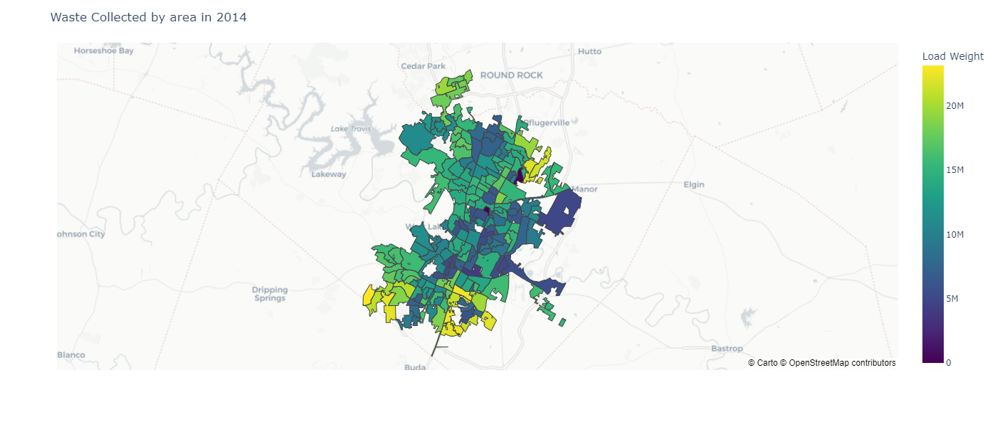

In [372]:
create_garbage_graph(year=2014)

Looking at the chart above, waste weight is higher on the north and south peripheral areas.

/home/jupyter/zipcode/zip_to_poly.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:53: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



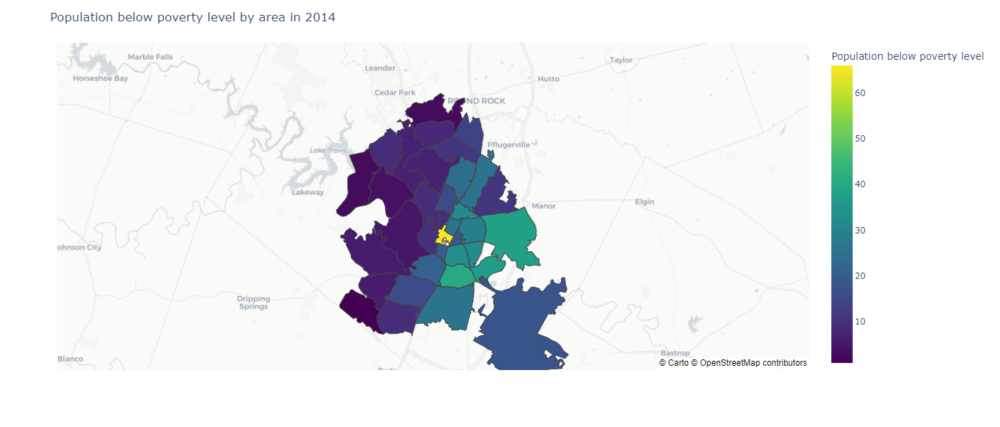

In [3]:
df = pd.read_csv("2014_Housing_Market_Analysis_Data_by_Zip_Code.csv")
plot_metric_by_zip(df, "Population below poverty level", column_name="Zip Code",year=2014, add_poly=True)

Looking at poverty level by area, poverty seems higher as we move towards the south-eastern part of Austin, thus not indicating any correlation with garbage generation.

/home/jupyter/zipcode/zip_to_poly.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:53: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



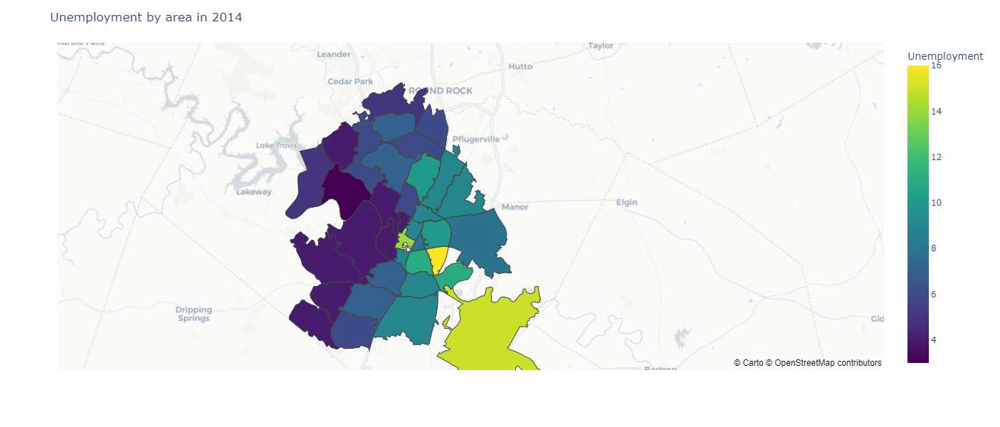

In [4]:
plot_metric_by_zip(df, "Unemployment", column_name="Zip Code",year=2014,add_poly=True)

Looking at unemployment levels by area, unemployment seems higher as we move towards the south-eastern part of Austin, thus not indicating any correlation with garbage generation.

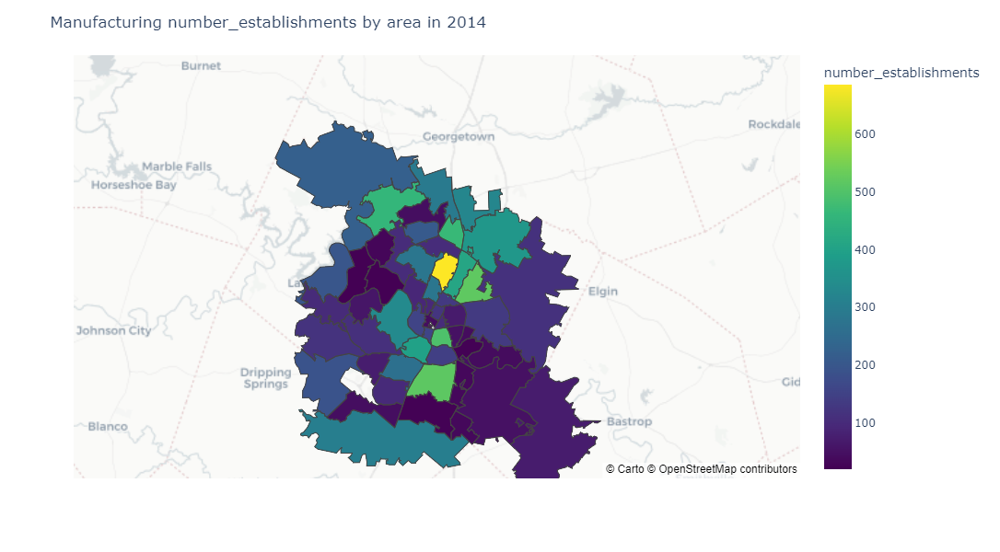

In [43]:
year = 2014
df_manu = df.loc[df.year==year]
df_manu = df_manu.loc[df_manu.definition_short=="Manufacturing"]
df_manu = df_manu.groupby(by="zip")["number_establishments"].sum()
df_manu = df_manu.reset_index()
plot_metric_by_zip(df_manu, "number_establishments", column_name="zip", add_poly=True, parse_metric_by_zip_bool=False, text="Manufacturing ", year=year )

Looking at the chart above, number of establishments is higher on the north and south peripheral areas. This indicates correlation with garbage generation.

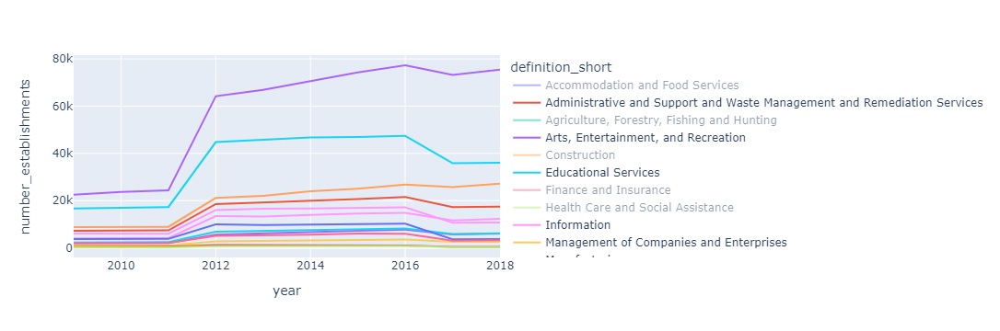

In [84]:
fig = px.line(df_year_establishments_with_type, x="year", y="number_establishments", color='definition_short')
fig.show()

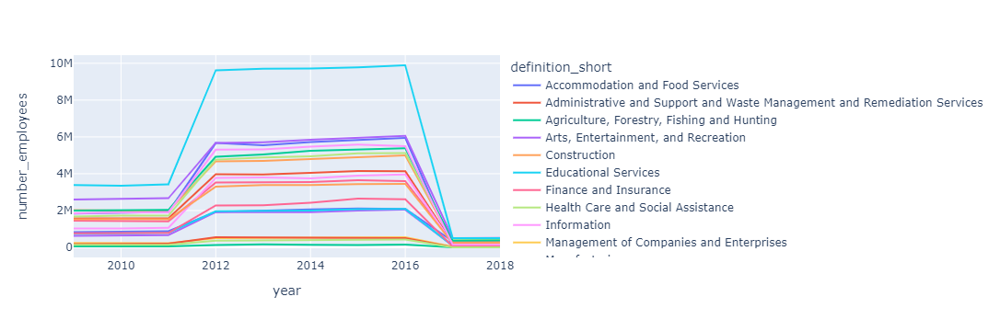

In [88]:
df_year_establishments_with_type = df.groupby(by=["year","definition_short"])["number_employees"].sum().reset_index()
fig = px.line(df_year_establishments_with_type, x="year", y="number_employees", color='definition_short')
fig.show()

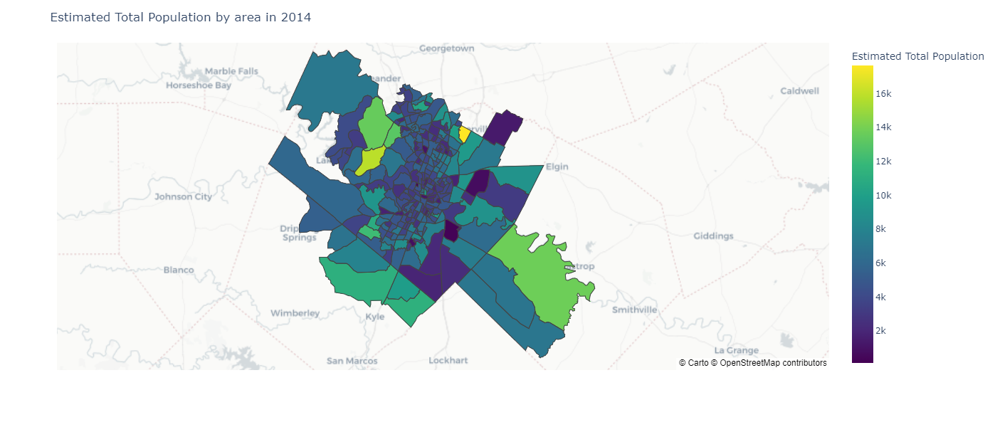

In [220]:
year = 2014
metric = "Estimated Total Population"
df_socioeconomic2 = df_socioeconomic.loc[df_socioeconomic.Year==year]
df_socio_pop = df_socioeconomic2.groupby(by="the_geom")["Estimated Total Population"].sum()
df_socio_pop = df_socio_pop.reset_index()
plot_metric_by_zip(df_socio_pop, metric,add_poly=False, parse_metric_by_zip_bool=False, year=year )

Looking at Total Population by area, the peripheral Northern and especially Southern area of Austin seem to have the highest population. This indicates correlation with garbage generation, but seems a weaker correlation than the Manufacturing establishments.

Data Preparation and Cleaning

In [374]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.tools.eval_measures import rmse, aic

In [375]:
# Convert Route_ID to Zip Codes, and calculate its area % in the route
rtz = pd.read_csv("/home/jupyter/Waste_Collection___Diversion_Report__daily_PARSED_DATES_with_zips.csv")
rtz_grouped = rtz.groupby(['zip', 'route']).agg({'area': 'mean'})
rtz_grouped['%'] = rtz_grouped['area'] / rtz_grouped.groupby('route')['area'].transform('sum')
rtz_grouped = pd.DataFrame(rtz_grouped).reset_index()

In [376]:
#Waste Collection Dataset
gb = pd.read_csv("/home/jupyter/Waste_Collection___Diversion_Report__daily_PARSED_DATES.csv")

#set index to Report_dates_datetime
gb["Report_dates_datetime2"] = pd.to_datetime(gb.Report_dates_datetime)

#remove years 2003 and 2004
gb = gb[gb.Report_dates_datetime2>='2005-01-01']
gb['Year'] = gb['Report_dates_datetime2'].dt.year
gb['Month'] = gb['Report_dates_datetime2'].dt.month


In [377]:
# Join rtz dataframe
import sqlite3

#Make the db in memory
conn = sqlite3.connect(':memory:')
#write the tables
gb.to_sql('gb', conn)
rtz_grouped.to_sql('rtz_grouped', conn)

qry = '''
    select  
        gb."Route Number",
        gb."Load Type",
        rtz_grouped."zip",
        gb."Year",
        (gb."Load Weight" * rtz_grouped."%") as Load_Weight
    from
        gb left join rtz_grouped on
        gb."Route Number" = rtz_grouped."route"
    '''
gb = pd.read_sql_query(qry, conn)



/opt/conda/lib/python3.7/site-packages/pandas/core/generic.py:2882: UserWarning:

The spaces in these column names will not be changed. In pandas versions < 0.14, spaces were converted to underscores.



In [378]:
#group by Route Number, Zip, Year
gb_grouped = gb.groupby(["Route Number", "zip", "Year"])["Load_Weight"].sum()

In [379]:
#Active Businesses Dataset
sp = pd.read_csv("/home/jupyter/Active_Sales_Tax_Permit_Holders.csv")

#set index to Report_dates_datetime
sp["Outlet First Sales Date"] = pd.to_datetime(sp["Outlet First Sales Date"])
sp = sp.set_index(sp["Outlet First Sales Date"])
sp['Year'] = sp['Outlet First Sales Date'].dt.year

#Create dataset with years needed
years = pd.DataFrame(list(range(2006,2021)))
years.columns = ["Year"]

#Join years needed and roll # of businesses cumulative over time
import sqlite3

#Make the db in memory
conn = sqlite3.connect(':memory:')
#write the tables
sp.to_sql('sp', conn, index=False)
years.to_sql('years', conn, index=False)

qry = '''
    select  
        years.Year,
        sp."Outlet NAICS Code" as "ID_Business_Type",
        sp."Outlet Zip Code",
        count(sp."Taxpayer Number") as "#_Businesses"
    from
        years join sp on
        years.Year <= sp."Year"
    group by years.Year, sp."Outlet Zip Code", sp."Outlet NAICS Code"
    '''
sp = pd.read_sql_query(qry, conn)

In [380]:
#group by Year, Zip
sp_grouped = sp.groupby(["Outlet Zip Code", "Year"])["#_Businesses"].sum()
sp_grouped = pd.DataFrame(sp_grouped.reset_index())

In [383]:
#Crime statistics Dataset
cs = pd.read_csv("/home/jupyter/crime_stats.csv")

#set index to Report_dates_datetime
cs["Occurred Date"] = pd.to_datetime(cs["Occurred Date"])
#cs = cs.set_index(cs["Occurred Date"])

#remove years 2003 and 2004 and Coordinates outliers
cs = cs[(cs["Occurred Date"]>='2005-01-01') & (abs(cs["Longitude"])>=1) &  (abs(cs["Latitude"])>=1)]
cs['Year'] = cs['Occurred Date'].dt.year
cs['Month'] = cs['Occurred Date'].dt.month

/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3524: DtypeWarning:

Columns (16) have mixed types.Specify dtype option on import or set low_memory=False.



In [484]:
#group by Year, Zip
cs_grouped = pd.DataFrame(cs.groupby(["Zip Code", "Year"])["Highest Offense Code"].median())
cs_grouped = pd.DataFrame(cs_grouped.reset_index())

In [385]:
#Short-term rental Dataset
st = pd.read_csv("/home/jupyter/Short_Term_Rental_Locations.csv")
st['Year'] = st['CASE_NUMBER'].str[:4]
st = st[st.Year<'2021']

#group by Year, Zip
st_grouped = st.groupby(["Year", "PROP_ZIP"])["CASE_NUMBER"].count()

In [386]:
#Affordable housing Dataset
ah = pd.read_csv("/home/jupyter/City_of_Austin_Affordable_Housing_Inventory.csv")

#Create dataset with years needed
years = pd.DataFrame(list(range(2006,2021)))
years.columns = ["Year"]

import sqlite3

#Make the db in memory
conn = sqlite3.connect(':memory:')
#write the tables
ah.to_sql('ah', conn, index=False)
years.to_sql('years', conn, index=False)

qry = '''
    select  
        years.Year,
        ah."Zip Code",
        count(ah."Austin Housing Inventory ID") as "#_Affordable_Housing"
    from
        years join ah on
        years.Year between ah."Affordability Start Year" and ah."Affordability Expiration Year"
    group by years.Year, ah."Zip Code"
    '''
ah = pd.read_sql_query(qry, conn)

#group by Year, Zip
ah_grouped = ah.groupby(["Year", "Zip Code"])["#_Affordable_Housing"].sum()

/opt/conda/lib/python3.7/site-packages/pandas/core/generic.py:2882: UserWarning:

The spaces in these column names will not be changed. In pandas versions < 0.14, spaces were converted to underscores.



In [387]:
#Socioeconomic Dataset

sec = pd.read_csv("/home/jupyter/socioeconomic_by_zip.csv")

#Create dataset with years needed
years = pd.DataFrame(list(range(2006,2021)))
years.columns = ["Year"]

import sqlite3

#Make the db in memory
conn = sqlite3.connect(':memory:')
#write the tables
sec.to_sql('sec', conn, index=False)
years.to_sql('years', conn, index=False)

qry = '''
    select  
        years.Year as "Y",
        sec."zip_code" as "zip",
        sec.*
    from
        years left join sec on
        years.Year between sec."Year" and (sec."Year" + 1)
    '''
sec = pd.read_sql_query(qry, conn)
sec = pd.DataFrame(sec.reset_index())

#Distribute KPIs by Zip
sec = sec[['EPL_NOHSDP', 'EPL_POV', 'EPL_UNEMP', 'Estimated Total Population', 'Per capita income estimate', 'zip', "Y", "index"]].drop_duplicates()
sec['VL_Estimated_Population'] = sec['Estimated Total Population']**2 / sec.groupby('index')['Estimated Total Population'].transform('sum')

#group by Year, Zip
sec_grouped = sec.groupby(['zip', "Y"])["VL_Estimated_Population"].sum()
sec_grouped = sec.groupby(['zip', 'Y']).agg({'VL_Estimated_Population': 'sum', 'EPL_NOHSDP': 'mean', 
                                                'EPL_POV': 'mean', 'EPL_UNEMP': 'mean', 'Per capita income estimate': 'mean'})

In [388]:
#Prepare data for model
gb_t=pd.DataFrame(gb_grouped.reset_index())
ah_t=pd.DataFrame(ah_grouped.reset_index())
st_t=pd.DataFrame(st_grouped.reset_index())
sp_t=pd.DataFrame(sp_grouped.reset_index())
cs_t=pd.DataFrame(cs_grouped.reset_index())
sec_t=pd.DataFrame(sec_grouped.reset_index())
st_t['Year']=st_t['Year'].astype(int)

#Merge all datasets
merged1 = pd.merge(gb_t, ah_t, left_on=["zip", "Year"], right_on=["Zip Code", "Year"], suffixes=('_x', '_y'), how="left")
merged2 = pd.merge(merged1, st_t, left_on=["zip", "Year"], right_on=["PROP_ZIP", "Year"], suffixes=('_x', '_y'), how="left")
merged3 = pd.merge(merged2, sp_t, left_on=["zip", "Year"], right_on=["Outlet Zip Code", "Year"], suffixes=('_x', '_y'), how="left")
merged4 = pd.merge(merged3, cs_t, left_on=["zip", "Year"], right_on=["Zip Code", "Year"], suffixes=('_x', '_y'), how="left")
merged5 = pd.merge(merged4, sec_t, left_on=["zip", "Year"], right_on=["zip", "Y"], suffixes=('_x', '_y'), how="left") 

In [389]:
#Rename and organize columns
merged_final = merged5.drop(columns=["Zip Code_x", "PROP_ZIP", "Outlet Zip Code", "Zip Code_y", "index_x", "index_y", "Y"])
merged_final.rename(columns = {'Highest Offense Code':'VL_Offense_Severity', 
                               'CASE_NUMBER':'#_Short_Term_Rentals', 'Route Number':'ID_Route', 'zip':'ID_Zip_Code', 'Year':'ID_Year', 'Load_Weight':'VL_Load_Weight',
                               'EPL_NOHSDP':'%_No_HS_Diploma', 'EPL_POV':'%_POV', 'EPL_UNEMP':'%_UNEMP', 'Per capita income estimate':'VL_Income_Per_Capita'},
                    inplace = True)

In [ ]:
merged_final

In [391]:
import pandas as pd
from dateutil import relativedelta
from statsmodels.tsa.ar_model import AutoReg
import numpy as np
from datetime import date
from dateutil import relativedelta
from sklearn.model_selection import train_test_split
import xgboost
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.preprocessing import StandardScaler

In [392]:
y = merged_final["VL_Load_Weight"]
x = merged_final[list(merged_final.keys())[4:]]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1, shuffle=False)
scalerX = StandardScaler().fit(x_train)

x_train_scaled = scalerX.transform(x_train)
x_test_scaled = scalerX.transform(x_test)

In [393]:
model = xgboost.XGBRegressor(objective='reg:squarederror', \
                           n_estimators=1000, \
                          nthread=24)

In [394]:
# train model and calculate test metrics
model.fit(x_train_scaled, y_train, verbose=1)
predictions_xgb = model.predict(x_test_scaled)
rmse_xgb = sqrt(mean_squared_error(y_test, predictions_xgb))

Text(0, 0.5, 'Load Weight')

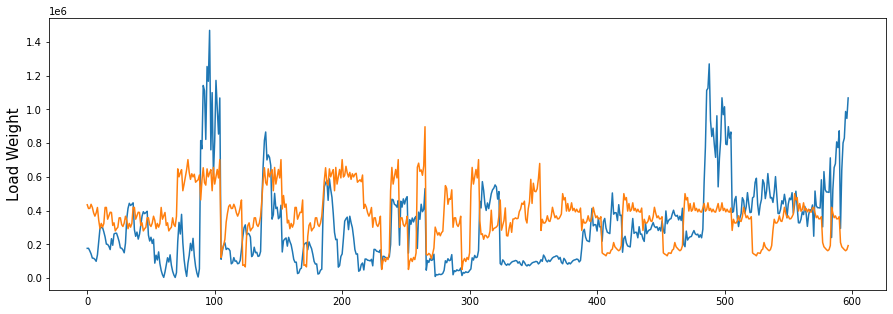

In [395]:
fig = plt.figure(figsize=(15,5))

plt.plot(list(y_test))
plt.plot(predictions_xgb)
plt.ylabel("Load Weight",{"fontsize":15} )
# plt.xlabel("Year",{"fontsize":15} )

Text(0.5, 1.0, 'Test Predictions By Year')

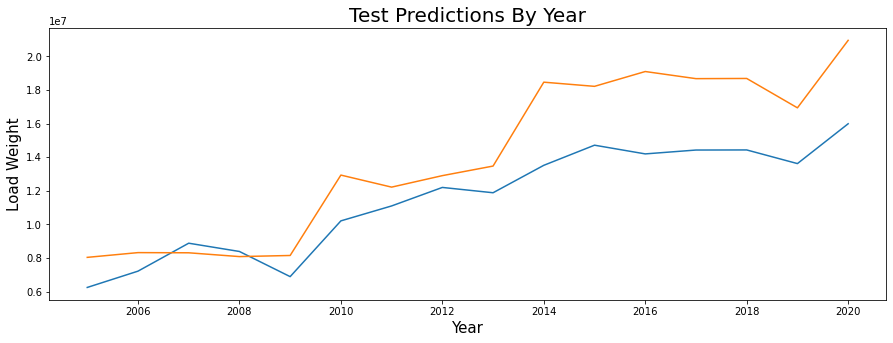

In [448]:
fig = plt.figure(figsize=(15,5))

plt.plot(df_years["ID_Year"],df_years["VL_Load_Weight"])
plt.ylabel("Load Weight",{"fontsize":15} )
plt.xlabel("Year",{"fontsize":15} )
plt.plot(df_years["ID_Year"],df_years["preds"])
plt.title("Test Predictions By Year", {"fontsize":20})

In [410]:
df_tests = merged_final.iloc[-598:]
df_tests["preds"] = predictions_xgb
df_years = df_tests.groupby("ID_Year")["VL_Load_Weight", "preds"].sum()
df_years = df_years.reset_index()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



Text(0.5, 1.0, 'Model Feature Significance')

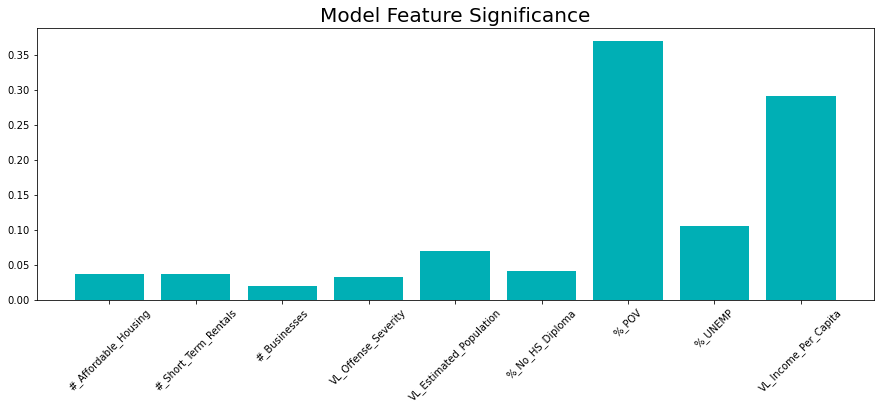

In [405]:
fig = plt.figure(figsize=(15,5))
plt.bar(list(x.keys()), model.feature_importances_, color="#00AFB5")
plt.xticks(rotation = 45)
plt.title("Model Feature Significance", {"fontsize":20})